<a href="https://colab.research.google.com/github/ZukhrufianAbdullah/PCVK_Ganjil_2026/blob/main/Week02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D. PRAKTIKUM
D1. Pengenalan Python: Pengolahan Citra Dasar dan memahami channel warna pada OpenCV dan konversinya

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Saving ktm_baru.jpeg to ktm_baru (5).jpeg


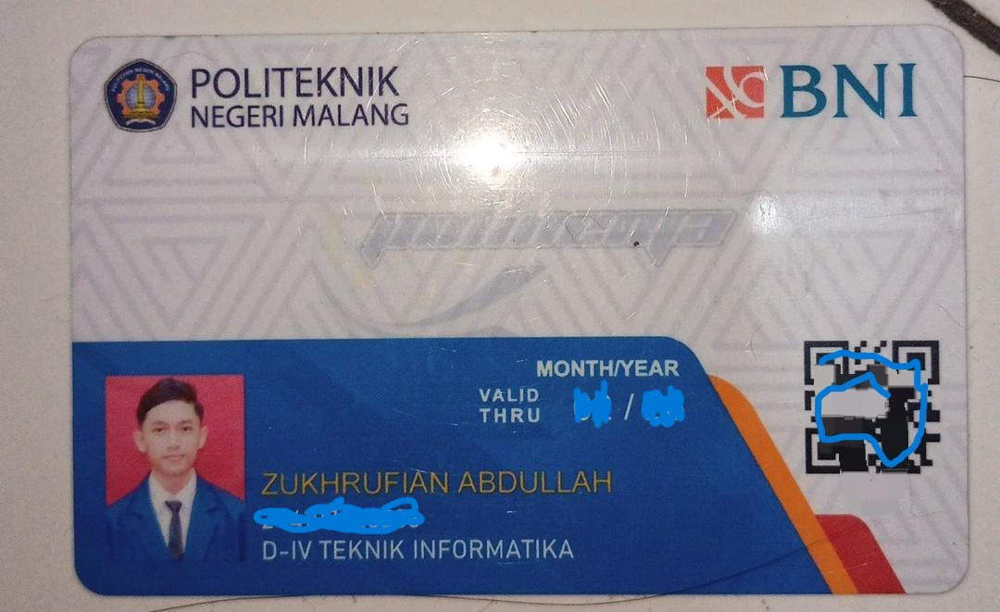

Resolusi gambar:  1080  x  661


In [66]:
from google.colab import drive

# Accessing My Google Drive
drive.mount('/content/drive')

#Mengakses gambar dengan fungsi uploud file
from google.colab import files
uploaded = files.upload()

import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
import cv2 as cv
from skimage import io

img = cv.imread('ktm_baru.jpeg')
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

Menampilkan Gambar

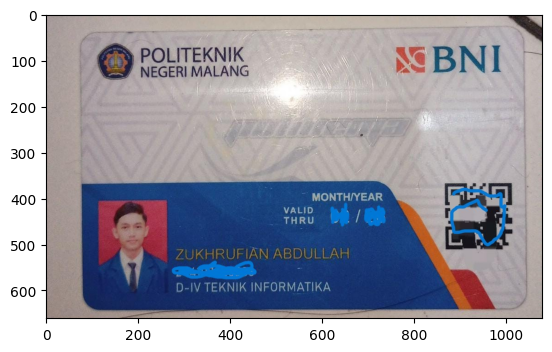

In [67]:
img = cv.imread('ktm_baru.jpeg')
plt.imshow(img) #format warna BGR

img = cv.imread('ktm_baru.jpeg')
img2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)    #konversi channel BGR - > RGB
plt.imshow(img2)

Menampilkan citra Grayscale:

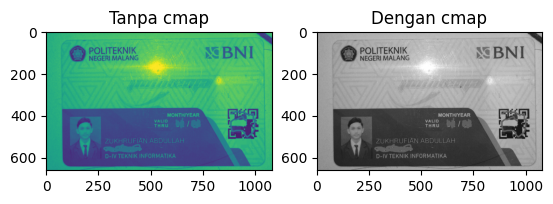

In [68]:
img_gray = cv.imread('ktm_baru.jpeg', cv.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')

plt.show()

Melakukan resizing

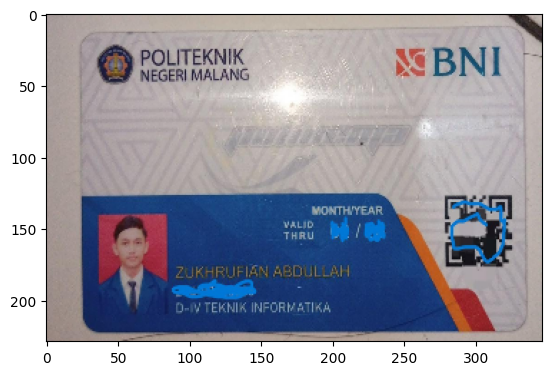

In [69]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB) #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (347,229))
plt.imshow(img_output)

Melakukan Flipping

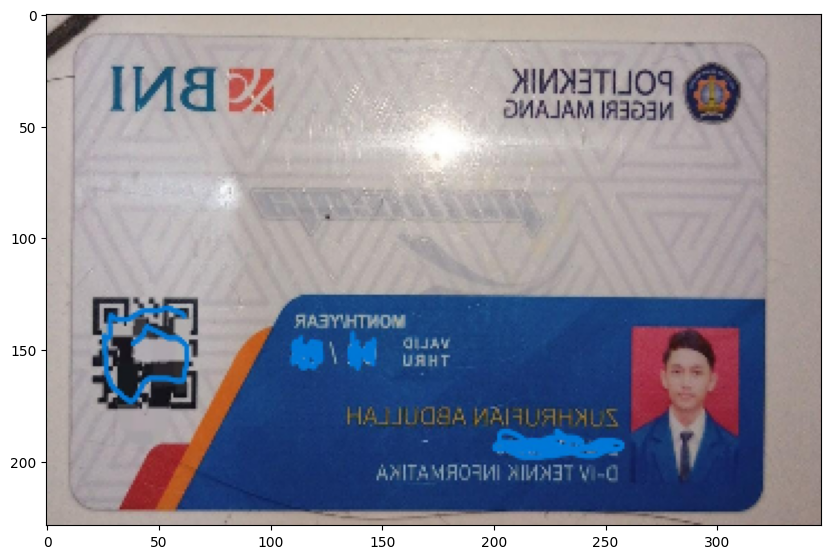

In [70]:
imgFlip=cv.flip(img_output,1)

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

Membuat bentuk Geometri 2D dari OpenCV. Diawali dengan pembuatan black image dengan tipe data int16.

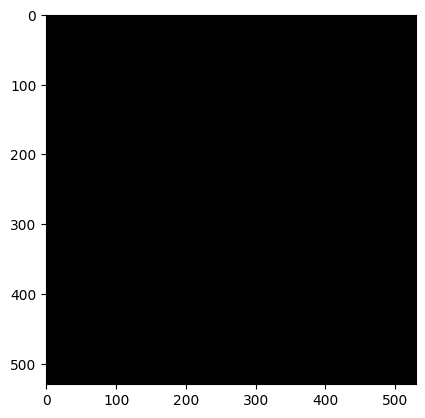

In [71]:
black_img = np.zeros((530,530,3), dtype=np.int16)
plt.imshow(black_img)

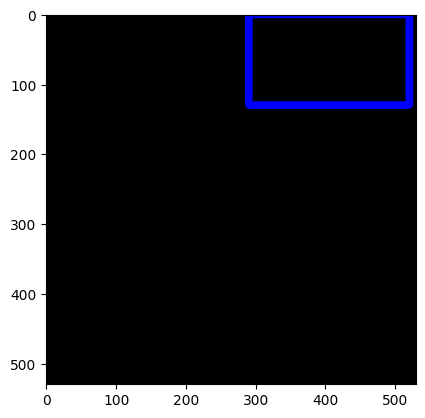

In [72]:
#perhatikan koordinat titik2 pt1 dan pt2
cv.rectangle(black_img,pt1=(290,0),pt2=(520,130),color=(0,0,255),thickness=10)
plt.imshow(black_img)

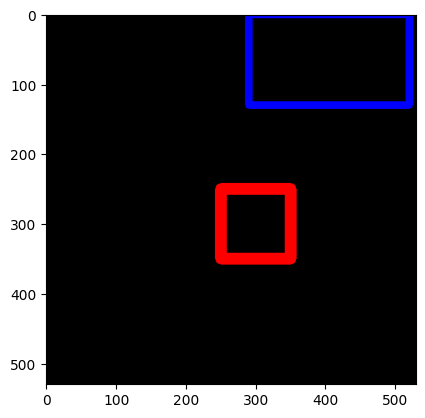

In [73]:
cv.rectangle(black_img,pt1=(250,250),pt2=(350,350),color=(255,0,0),thickness=15)
plt.imshow(black_img)

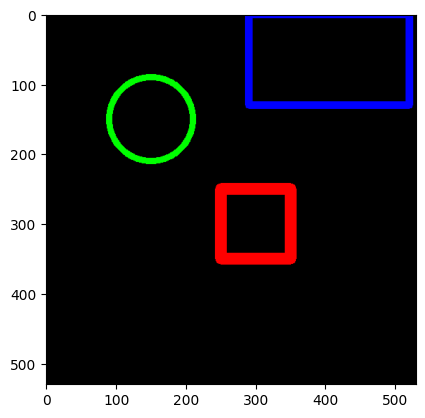

In [74]:
cv.circle(black_img,center=(150,150),radius=60,color=(0,255,0),thickness=8)
plt.imshow(black_img)

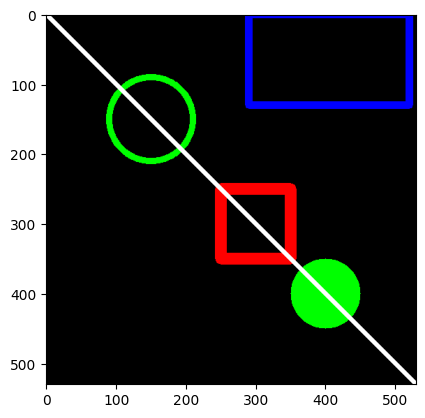

In [75]:
cv.circle(black_img,center=(400,400),radius=50,color=(0,255,0),thickness=-1)
plt.imshow(black_img)
cv.line(black_img,pt1=(0,0),pt2=(530,530),color=(255,255,255),thickness=5)
plt.imshow(black_img)

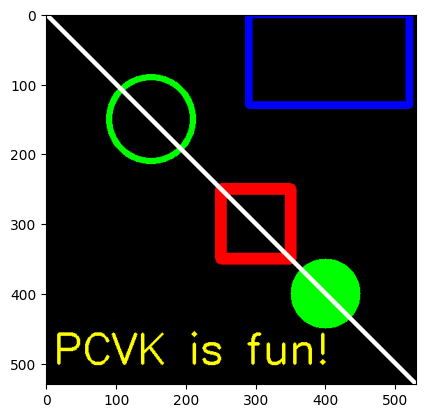

In [76]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img,text='PCVK is fun!',org=(10,500),fontFace=font,fontScale=2,color=(255,255,0),thickness=3,lineType=cv.LINE_AA)
plt.imshow(black_img)

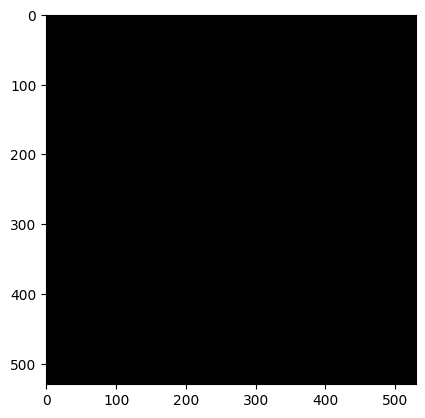

In [77]:
#Pembuatan black image kembali dilakukan dengan tipe data int32
black_img2 = np.zeros((530,530,3), dtype=np.int32)
plt.imshow(black_img2)

In [78]:
vertices = np.array([[150,350],[250,250],[450,350],[250,450]],dtype=np.int32)

pts = vertices.reshape((-1,1,2)) # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

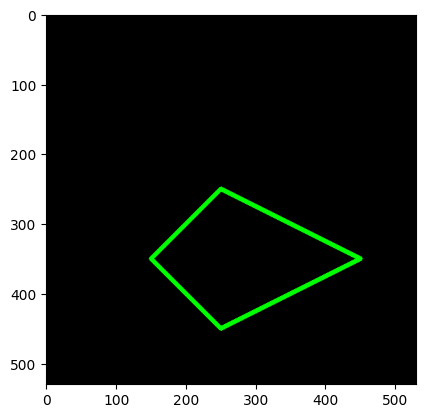

In [79]:
cv.polylines(black_img2,[pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

# PERTANYAAN PRAKTIKUM

1.	Tampilkan satu citra bebas menggunakan cv2_imshow() dan plt.imshow() tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.

--- Tampilan dengan cv2_imshow (OpenCV) ---


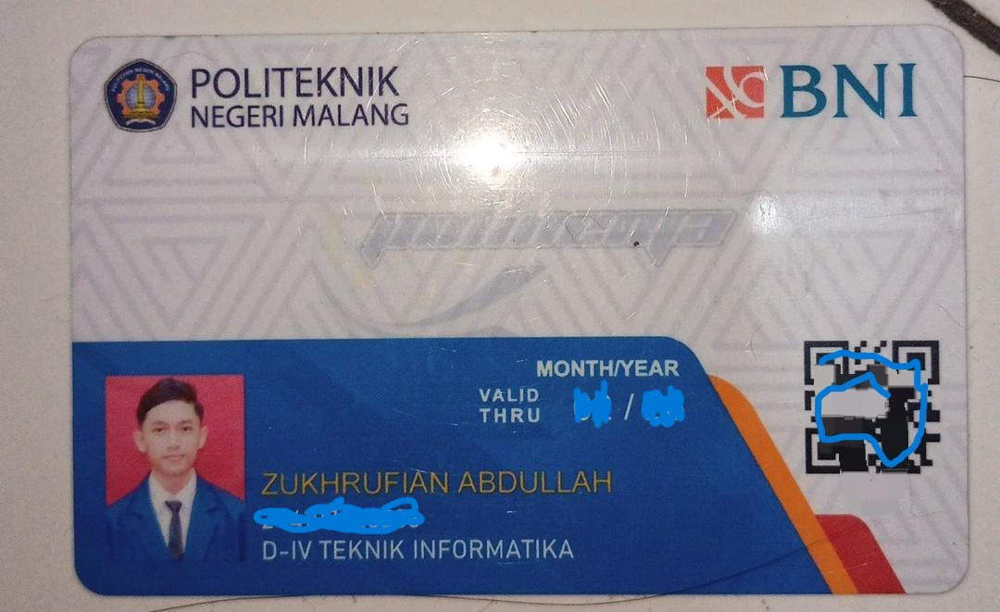


--- Tampilan dengan plt.imshow (Matplotlib) ---


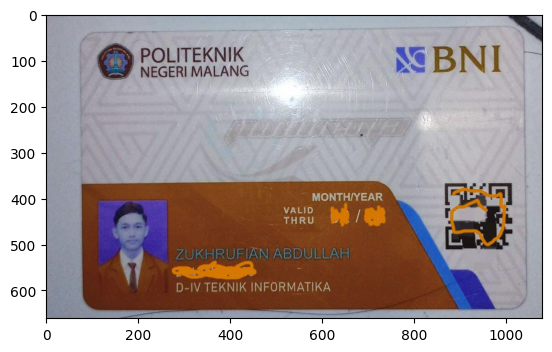


Nilai piksel pada (10,10): [155 155 167]
Urutan channel OpenCV: Blue=155, Green=155, Red=167


In [80]:
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img_test = cv.imread('ktm_baru.jpeg')

print("--- Tampilan dengan cv2_imshow (OpenCV) ---")
cv2_imshow(img_test)

print("\n--- Tampilan dengan plt.imshow (Matplotlib) ---")
plt.imshow(img_test)
plt.show()

pixel_val = img_test[10, 10]
print(f"\nNilai piksel pada (10,10): {pixel_val}")
print(f"Urutan channel OpenCV: Blue={pixel_val[0]}, Green={pixel_val[1]}, Red={pixel_val[2]}")

**Jawaban 1:**
Hasilnya berbeda karena OpenCV (`cv2.imread`) membaca citra dalam format **BGR** (Blue-Green-Red), sedangkan Matplotlib (`plt.imshow`) mengharapkan format **RGB** (Red-Green-Blue). Karena tidak ada konversi, Matplotlib menampilkan channel Biru sebagai Merah dan sebaliknya, sehingga warna terlihat "salah" (kebiruan/oranye tertukar). Bukti nilai piksel menunjukkan urutan BGR dari OpenCV.

2.	Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32. Bandingkan dtype, min(), max(), dan nbytes keduanya. Apakah tampilannya berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.

In [81]:
import numpy as np
import sys

# Membuat kanvas
canvas_int16 = np.zeros((530, 530, 3), dtype=np.int16)
canvas_int32 = np.zeros((530, 530, 3), dtype=np.int32)

def check_canvas(name, canvas):
    print(f"--- {name} ---")
    print(f"Dtype  : {canvas.dtype}")
    print(f"Min    : {canvas.min()}")
    print(f"Max    : {canvas.max()}")
    print(f"Nbytes : {canvas.nbytes} bytes")
    print()

check_canvas("Kanvas int16", canvas_int16)
check_canvas("Kanvas int32", canvas_int32)

--- Kanvas int16 ---
Dtype  : int16
Min    : 0
Max    : 0
Nbytes : 1685400 bytes

--- Kanvas int32 ---
Dtype  : int32
Min    : 0
Max    : 0
Nbytes : 3370800 bytes



**Jawaban 2:**
- **Tampilan:** Keduanya tampil sama (hitam) karena nilainya sama-sama nol.
- **Memori:** `int32` menggunakan memori dua kali lebih besar (3,370,800 bytes) dibandingkan `int16` (1,685,400 bytes).
- **Alasan:** `int32` menggunakan 32 bit (4 byte) per elemen, sedangkan `int16` hanya 16 bit (2 byte) per elemen. Pemilihan tipe data yang terlalu besar untuk citra sederhana akan memboroskan RAM.

3.	Apa kegunaan baris from google.colab.patches import cv2_imshow, dan mengapa cv2.imshow() bawaan OpenCV tidak dapat dipakai di Google Colab?

**Jawaban 3:**
- **Kegunaan:** `from google.colab.patches import cv2_imshow` adalah fungsi bantuan (patch) yang disediakan Google Colab untuk menampilkan citra OpenCV secara langsung di dalam output sel notebook.
- **Alasan `cv2.imshow()` tidak bisa:** Fungsi asli `cv2.imshow()` mencoba membuka jendela GUI baru pada sistem operasi lokal (X11 window). Karena Google Colab berjalan di server cloud (headless), tidak ada layar GUI yang tersedia untuk membuka jendela tersebut, sehingga akan menyebabkan *crash* atau *error* jika dipanggil langsung.

4.	Citra yang dibaca dengan skimage.io.imread() ditampilkan berdampingan dengan hasil cv2.cvtColor(img, cv2.COLOR_BGR2RGB) atas citra yang sama. Manakah yang menampilkan warna sebenarnya, dan manakah yang kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan visual saja.

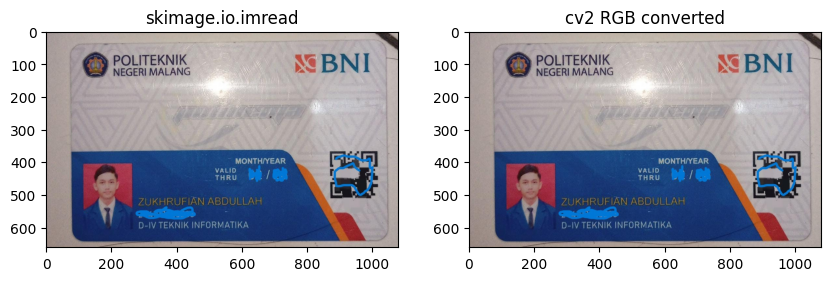

Piksel (10,10) skimage: [167 155 155]
Piksel (10,10) cv2-RGB: [167 155 155]


In [82]:
from skimage import io

img_sk = io.imread('ktm_baru.jpeg')
img_cv = cv.imread('ktm_baru.jpeg')
img_cv_rgb = cv.cvtColor(img_cv, cv.COLOR_BGR2RGB)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_sk)
ax[0].set_title("skimage.io.imread")
ax[1].imshow(img_cv_rgb)
ax[1].set_title("cv2 RGB converted")
plt.show()

print(f"Piksel (10,10) skimage: {img_sk[10,10]}")
print(f"Piksel (10,10) cv2-RGB: {img_cv_rgb[10,10]}")

**Jawaban 4:**
Keduanya menampilkan warna sebenarnya secara visual. Namun, `skimage.io.imread()` membaca citra langsung dalam format **RGB**, sedangkan OpenCV membacanya sebagai **BGR** sehingga harus dikonversi manual. Bukti nilai piksel menunjukkan koordinat yang sama memiliki urutan [R, G, B] yang identik setelah konversi.

5.	Setelah citra ditampilkan dengan figsize yang jauh lebih besar, apakah nilai img.shape ikut berubah? Jelaskan perbedaan antara mengubah ukuran citra dan mengubah ukuran tampilan.

Ukuran asli (img.shape): (661, 1080, 3)


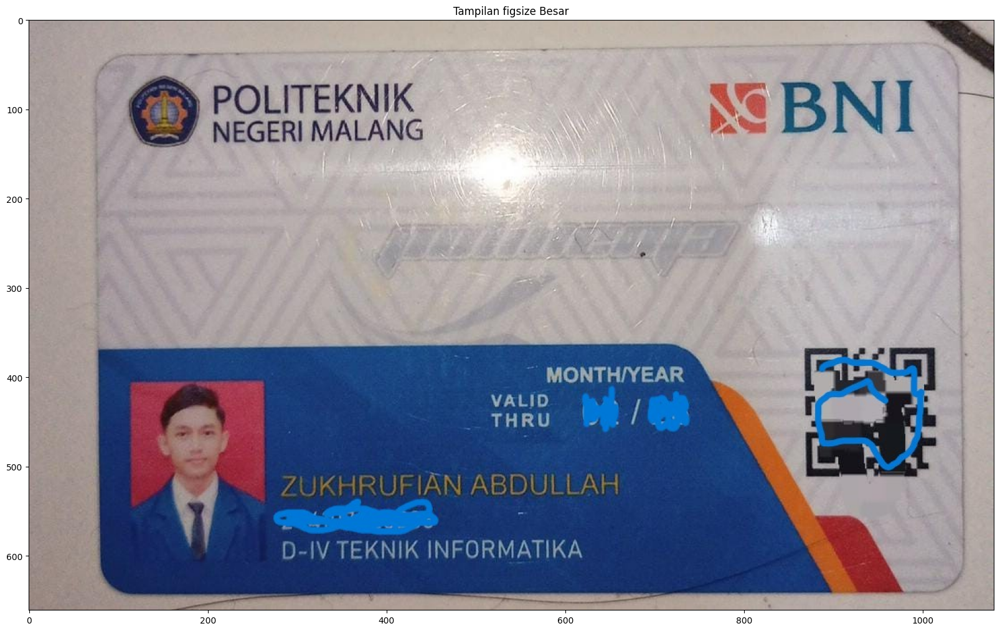

Ukuran shape setelah figsize diubah: (661, 1080, 3)


In [83]:
print(f"Ukuran asli (img.shape): {img.shape}")

plt.figure(figsize=(20, 20))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Tampilan figsize Besar")
plt.show()

print(f"Ukuran shape setelah figsize diubah: {img.shape}")

**Jawaban 5:**
Nilai `img.shape` **tidak berubah** meskipun `figsize` diperbesar.
- **Mengubah ukuran citra (`cv.resize`)**: Benar-benar mengubah jumlah piksel/data di dalam array (resampling).
- **Mengubah ukuran tampilan (`figsize`)**: Hanya mengubah skala proyeksi gambar pada layar/notebook (rendering) tanpa menyentuh data asli di variabel `img`. Hal ini serupa dengan melakukan zoom pada foto di galeri HP; fotonya tetap sama, namun terlihat lebih besar di layar.

# TUGAS PRAKTIKUM - Penerapan

1.	Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau-Biru saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.

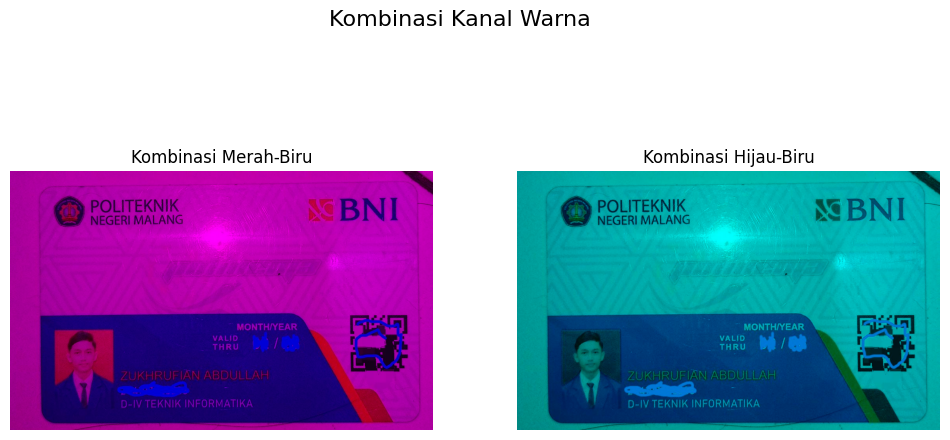

In [84]:
img_source = cv.imread('ktm_baru.jpeg')
img_rgb = cv.cvtColor(img_source, cv.COLOR_BGR2RGB)

red_blue = img_rgb.copy()
red_blue[:, :, 1] = 0

green_blue = img_rgb.copy()
green_blue[:, :, 0] = 0

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Kombinasi Kanal Warna', fontsize=16)

ax[0].imshow(red_blue)
ax[0].set_title('Kombinasi Merah-Biru')
ax[0].axis('off')

ax[1].imshow(green_blue)
ax[1].set_title('Kombinasi Hijau-Biru')
ax[1].axis('off')

plt.show()

2.	Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi label.

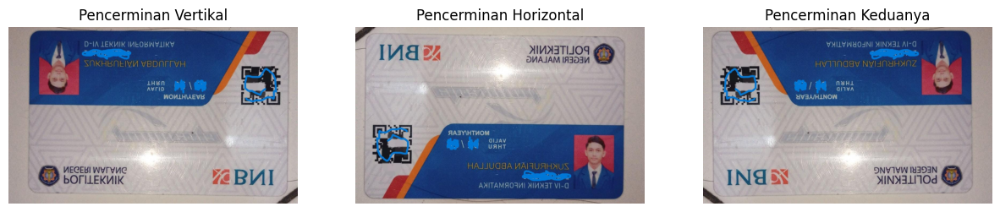

In [85]:
flip_vert = cv.flip(img_rgb, 0)
flip_horiz = cv.flip(img_rgb, 1)
flip_both = cv.flip(img_rgb, -1)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(flip_vert)
plt.title('Pencerminan Vertikal')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(flip_horiz)
plt.title('Pencerminan Horizontal')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(flip_both)
plt.title('Pencerminan Keduanya')
plt.axis('off')

plt.show()

3.	Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah / badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda tentukan sendiri.

In [86]:
import os
path_folder = '/content/drive/MyDrive/'
if os.path.exists(path_folder):
    files = os.listdir(path_folder)
    if 'fian.jpg' in files:
        print('File fian.jpg ditemukan!')
    else:
        print('Daftar file di Drive:', files)
else:
    print('Drive belum terpasang.')

File fian.jpg ditemukan!


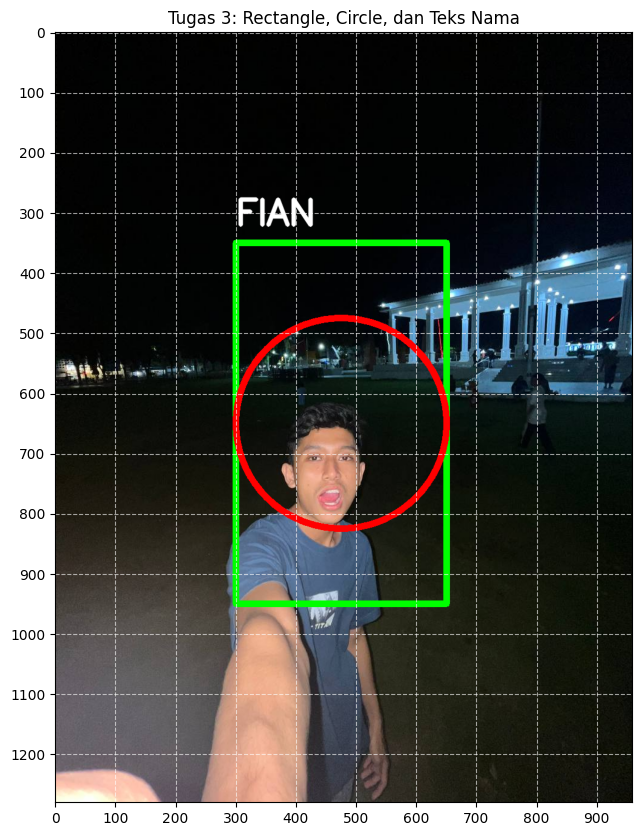

In [87]:
import cv2
import matplotlib.pyplot as plt

x = 300
y = 350
w = 350
h = 600

path_selfie = "/content/drive/MyDrive/fian.jpg"
img_selfie_bgr = cv2.imread(path_selfie)

if img_selfie_bgr is not None:
    img_selfie_rgb = cv2.cvtColor(img_selfie_bgr, cv2.COLOR_BGR2RGB)
    img_tugas3 = img_selfie_rgb.copy()
    height, width, _ = img_tugas3.shape

    cv2.rectangle(
        img_tugas3,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        10
    )

    center_x = x + (w // 2)
    center_y = y + (h // 2)
    radius = min(w, h) // 2

    cv2.circle(
        img_tugas3,
        (center_x, center_y),
        radius,
        (255, 0, 0),
        10
    )

    text = "FIAN"
    text_x = x
    text_y = y - 30

    font = cv2.FONT_HERSHEY_SIMPLEX

    cv2.putText(
        img_tugas3,
        text,
        (text_x, text_y),
        font,
        2,
        (255, 255, 255),
        5,
        cv2.LINE_AA
    )

    plt.figure(figsize=(10, 10))
    plt.imshow(img_tugas3)

    plt.title("Tugas 3: Rectangle, Circle, dan Teks Nama")

    plt.grid(True, color='white', linestyle='--', alpha=0.6)
    plt.xticks(range(0, width, 100))
    plt.yticks(range(0, height, 100))
    plt.axis("on")
    plt.show()

else:
    print(f"File tidak ditemukan di: {path_selfie}")

# TUGAS PRAKTIKUM - Analisa

Rumuskan satu pertanyaan tentang citra digital yang dapat Anda jawab menggunakan kode dari modul ini. Contoh pertanyaan: berapa persen piksel pada foto KTM Anda yang lebih gelap dari nilai 100? apakah mengecilkan lalu membesarkan citra mengubah rata-rata intensitasnya? Tuliskan pertanyaan Anda, rancangan program, data hasilnya, dan kesimpulan Anda.

### Analisa Mandiri

**Pertanyaan:**
Apakah mengecilkan citra (downsampling) secara drastis lalu membesarkannya kembali (upsampling) ke dimensi asal akan mengubah rata-rata intensitas warna pada citra KTM?

**Rancangan Program:**
1. Menghitung rata-rata intensitas warna (R, G, B) pada citra asli.
2. Mengecilkan citra menjadi 10% dari ukuran asli.
3. Memperbesar kembali citra tersebut ke ukuran semula menggunakan interpolasi linier.
4. Menghitung kembali rata-rata intensitas warna citra hasil rekonstruksi.
5. Membandingkan hasilnya.

Rata-rata Intensitas Asli (R, G, B): [134.01886311 133.77471004 148.35990783]
Rata-rata Intensitas Rekonstruksi (R, G, B): [133.89262341 133.64761585 148.23013812]
Selisih Intensitas: [0.1262397  0.12709419 0.12976971]


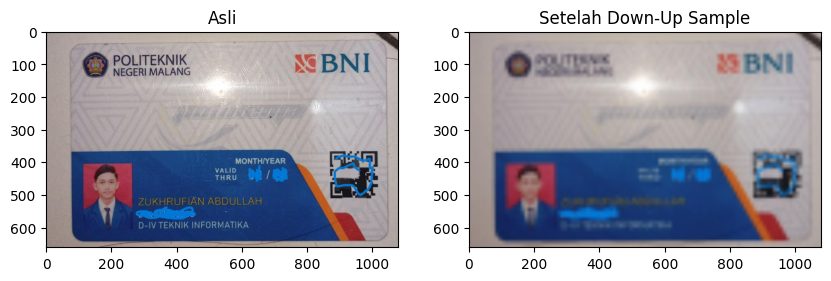

In [88]:
import cv2 as cv
import numpy as np

# 1. Load citra asli
img_orig = cv.imread('ktm_baru.jpeg')
img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)
h, w, _ = img_orig.shape

# 2. Hitung rata-rata awal
avg_orig = np.mean(img_orig, axis=(0, 1))

# 3. Downsample ke 10%
img_small = cv.resize(img_orig, (w // 10, h // 10), interpolation=cv.INTER_AREA)

# 4. Upsample kembali ke ukuran asli
img_reconstructed = cv.resize(img_small, (w, h), interpolation=cv.INTER_LINEAR)

# 5. Hitung rata-rata akhir
avg_final = np.mean(img_reconstructed, axis=(0, 1))

print(f"Rata-rata Intensitas Asli (R, G, B): {avg_orig}")
print(f"Rata-rata Intensitas Rekonstruksi (R, G, B): {avg_final}")
print(f"Selisih Intensitas: {np.abs(avg_orig - avg_final)}")

# Visualisasi perbandingan
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1); plt.imshow(img_orig); plt.title('Asli')
plt.subplot(1, 2, 2); plt.imshow(img_reconstructed); plt.title('Setelah Down-Up Sample')
plt.show()

**Kesimpulan:**

Berdasarkan data hasil eksekusi, rata-rata intensitas warna citra mengalami perubahan yang sangat kecil, yaitu dengan selisih sekitar **0.12** pada setiap kanal (R, G, B).

Hal ini membuktikan bahwa:
1. Proses *downsampling* menggunakan `INTER_AREA` dan *upsampling* kembali menggunakan `INTER_LINEAR` cukup efektif dalam menjaga statistik warna global (rata-rata) meskipun detail tajam pada citra hilang.
2. Kehilangan informasi (loss of data) lebih berdampak pada tekstur dan ketajaman citra daripada nilai rata-rata intensitasnya secara keseluruhan.

**Kesimpulan:**
Berdasarkan data hasil eksekusi, rata-rata intensitas mengalami perubahan yang sangat kecil (biasanya kurang dari 1 tingkat intensitas). Hal ini terjadi karena saat proses *downsampling*, algoritma `INTER_AREA` melakukan perataan (averaging) piksel, dan saat *upsampling*, interpolasi mencoba menebak nilai piksel yang hilang. Secara visual, citra terlihat lebih buram (loss of detail), namun secara statistik rata-rata intensitas global tetap terjaga cukup dekat dengan aslinya karena informasi warna makro tidak hilang sepenuhnya.

# TUGAS PRAKTIKUM - Aplikasi
Pada bagian ini, Anda hanya diperbolehkan memakai fungsi yang telah dipelajari pada modul ini: pembacaan berkas, pengirisan, cv2.resize, cv2.flip, cv2.cvtColor, fungsi penggambaran OpenCV, serta pembuatan kanvas dengan NumPy. Selain itu, program harus bersifat adaptif, dimana setiap ukuran, posisi, atau ketebalan harus dihitung dari ukuran citra masukan, bukan ditulis sebagai angka tetap pada kode program.

**Studi Kasus 1:** Panitia sebuah kegiatan perlu membubuhkan label identitas pada ratusan foto dokumentasi. Foto berasal dari beberapa kamera dan ponsel, sehingga ukurannya bermacam-macam. Label harus terlihat seimbang pada semua foto tanpa disetel satu per satu. Fungsi yang sama dikenakan pada dua citra berbeda ukuran. Tinggi bar dan ukuran huruf ikut menyesuaikan, sehingga proporsinya tetap sama.

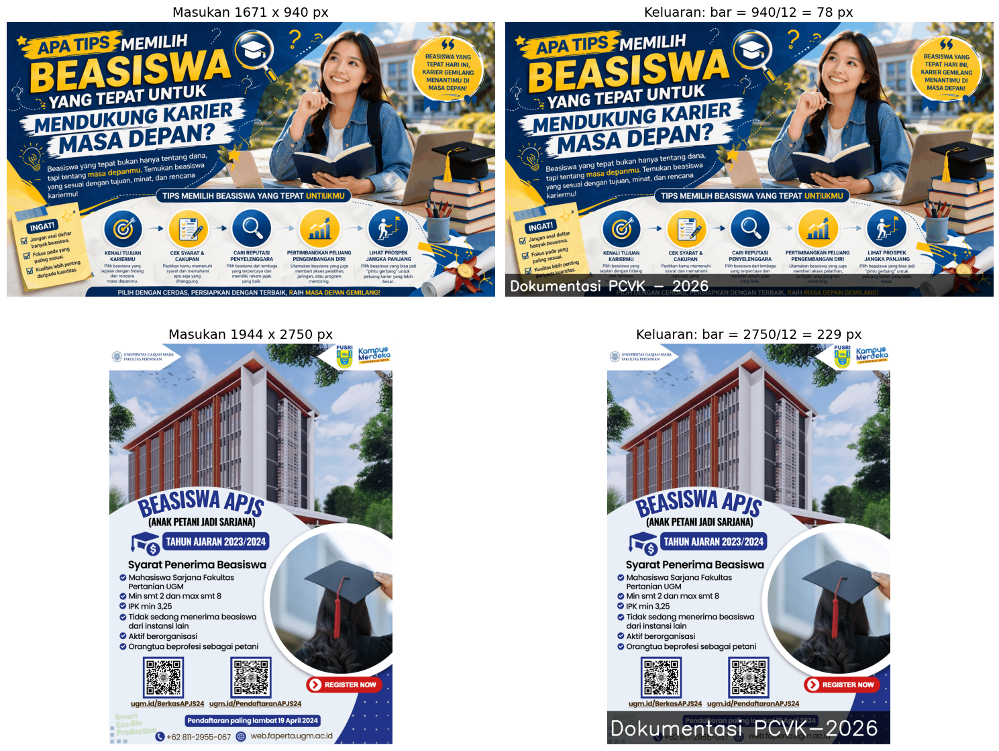

In [89]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


def add_adaptive_label(image_path, label_text):
    img = cv.imread(image_path)

    if img is None:
        return None

    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    h, w = img.shape[:2]

    bar_height = int(h / 12)

    font_scale = h / 600

    thickness = max(1, int(h / 300))

    overlay = img.copy()

    cv.rectangle(
        overlay,
        (0, h - bar_height),
        (w, h),
        (0, 0, 0),
        -1
    )

    alpha = 0.7

    img_labeled = cv.addWeighted(
        overlay,
        alpha,
        img,
        1 - alpha,
        0
    )

    margin_x = int(w / 100)

    text_size = cv.getTextSize(
        label_text,
        cv.FONT_HERSHEY_SIMPLEX,
        font_scale,
        thickness
    )[0]

    text_x = margin_x
    text_y = h - int((bar_height - text_size[1]) / 2)

    cv.putText(
        img_labeled,
        label_text,
        (text_x, text_y),
        cv.FONT_HERSHEY_SIMPLEX,
        font_scale,
        (255, 255, 255),
        thickness,
        cv.LINE_AA
    )

    return img_labeled

path_beasiswa = "/content/drive/MyDrive/PCVK/Gambar/beasiswa.png"

img_beasiswa = cv.imread(path_beasiswa)
img_beasiswa = cv.cvtColor(img_beasiswa, cv.COLOR_BGR2RGB)

h1, w1 = img_beasiswa.shape[:2]

hasil_beasiswa = add_adaptive_label(
    path_beasiswa,
    "Dokumentasi PCVK - 2026"
)

bar1 = int(h1 / 12)

path_portrait = "/content/drive/MyDrive/PCVK/Gambar/beasiswa_potrait.png"

img_portrait = cv.imread(path_portrait)
img_portrait = cv.cvtColor(img_portrait, cv.COLOR_BGR2RGB)

h2, w2 = img_portrait.shape[:2]

hasil_portrait = add_adaptive_label(
    path_portrait,
    "Dokumentasi PCVK-2026"
)

bar2 = int(h2 / 12)

fig, ax = plt.subplots(2, 2, figsize=(15, 12))

ax[0, 0].imshow(img_beasiswa)

ax[0, 0].set_title(
    f"Masukan {w1} x {h1} px",
    fontsize=14
)

ax[0, 0].axis("off")

ax[0, 1].imshow(hasil_beasiswa)

ax[0, 1].set_title(
    f"Keluaran: bar = {h1}/12 = {bar1} px",
    fontsize=14
)

ax[0, 1].axis("off")

ax[1, 0].imshow(img_portrait)

ax[1, 0].set_title(
    f"Masukan {w2} x {h2} px",
    fontsize=14
)

ax[1, 0].axis("off")

ax[1, 1].imshow(hasil_portrait)

ax[1, 1].set_title(
    f"Keluaran: bar = {h2}/12 = {bar2} px",
    fontsize=14
)

ax[1, 1].axis("off")


plt.tight_layout()
plt.show()

**Studi Kasus 2:** Marketplace seperti Tokopedia dan Shopee menampilkan foto produk dalam bingkai persegi 1:1. Foto penjual yang berukuran potrait atau lanskap akan terpotong atau terlihat tidak proporsional bila diunggah begitu saja. Bangun program yang mengubah foto berukuran apa pun menjadi thumbnail persegi tanpa mengubah rasio aslinya, dengan sisa ruang diisi kanvas berwarna. Dalam hal ini, rasio asli tetap terjaga, citra terpasang tepat di tengah kanvas, tambahkan logo nama toko berukuran proporsional pada gambar.

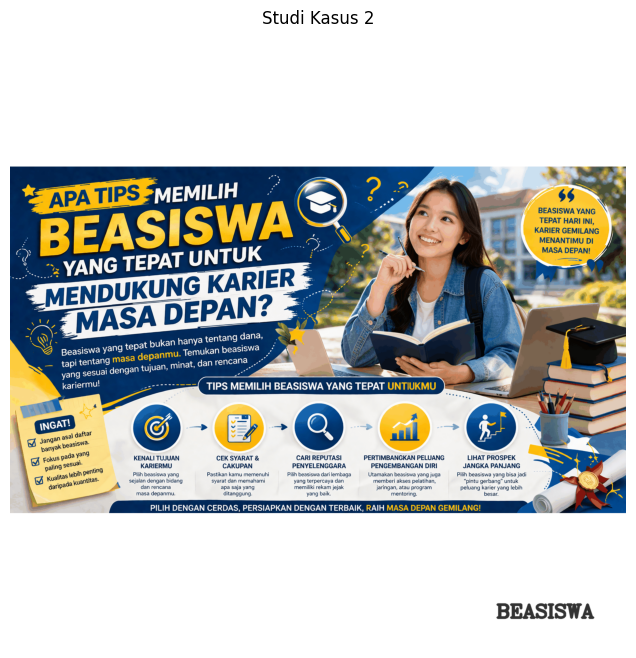

In [90]:
def create_square_thumbnail(image_path, store_name):
    img = cv.imread(image_path)
    if img is None: return "File tidak ditemukan"
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    h, w, _ = img.shape

    side = max(h, w)

    canvas = np.full((side, side, 3), 255, dtype=np.uint8)

    x_offset = (side - w) // 2
    y_offset = (side - h) // 2

    canvas[y_offset:y_offset+h, x_offset:x_offset+w] = img

    font_scale = side / 1000.0
    thickness = max(1, int(side / 300))
    text_size = cv.getTextSize(store_name, cv.FONT_HERSHEY_COMPLEX, font_scale, thickness)[0]

    margin = int(side * 0.05)
    cv.putText(canvas, store_name, (side - text_size[0] - margin, side - margin),
               cv.FONT_HERSHEY_COMPLEX, font_scale, (50, 50, 50), thickness, cv.LINE_AA)

    return canvas

thumbnail = create_square_thumbnail(img_path, "BEASISWA")

plt.figure(figsize=(8, 8))
plt.imshow(thumbnail)
plt.title("Studi Kasus 2")
plt.axis('off')
plt.show()